In [15]:
import sys
main_folder = '..'
if main_folder not in sys.path:
    sys.path.append(main_folder)

import numpy as np
import matplotlib.pyplot as plt
import torch
from mmdet.apis import init_detector, show_result_pyplot
from open_set.utils.eval.inference import inference_detector
import mmcv

In [16]:
# OVIS model
config_file = '../configs/demo/coco_instance_ag3x_1x.py'
checkpoint_file = '../checkpoints/coco_instance_ag3x_1x.pth'

In [17]:
# build the model from a config file and a checkpoint file
model = init_detector(config_file, checkpoint_file)

load checkpoint from local path: ../checkpoints/coco_instance_ag3x_1x.pth


In [18]:
classes = model.panoptic_fusion_head.ordered_class_names
print(classes)
print(len(classes))
# Mark the novel categories by '*'
# Here we use COCO 48/17 base/novel split
unknown_cat_names = model.panoptic_head.unknown_cat_names
CLASSES = []
for name in classes:
    if name in unknown_cat_names:
        name = '*' + name
    CLASSES.append(name)
model.CLASSES = CLASSES

['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'kite', 'skateboard', 'surfboard', 'bottle', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'pizza', 'donut', 'cake', 'chair', 'couch', 'bed', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'toothbrush']
65


(3074, 2421, 3)

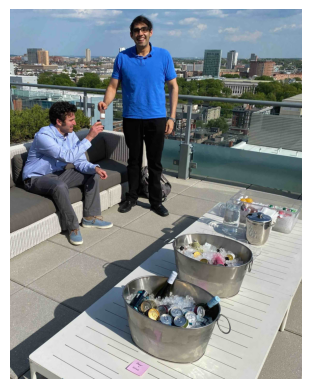

In [19]:
# img = mmcv.imread('../examples/umbrella_dog.png').astype(np.uint8)
# img = mmcv.bgr2rgb(img)
# plt.axis('off')
# plt.imshow(img)
# img.shape

img = mmcv.imread('../examples/andy.jpeg').astype(np.uint8)
img = mmcv.bgr2rgb(img)
plt.axis('off')
plt.imshow(img)
img.shape

In [20]:
# Predict segmentation results, as well as image captions
result = inference_detector(model, img, with_caption=True, logging=True)[0]

[CLS] two men sitting on top of a wooden bench [SEP] tensor(-3.9797)
[CLS] two men sitting on top of a wooden table. [SEP] tensor(-3.5444)
[CLS] two men sitting on top of a wooden bench. [SEP] tensor(-3.5737)
[CLS] two men sitting on top of a wooden floor. [SEP] tensor(-3.7531)
[CLS] a couple of people sitting on top of a table. [SEP] tensor(-3.6449)
[CLS] a couple of people sitting on top of a wooden bench [SEP] tensor(-3.9284)
[CLS] a couple of people sitting on top of a wooden table [SEP] tensor(-3.9870)


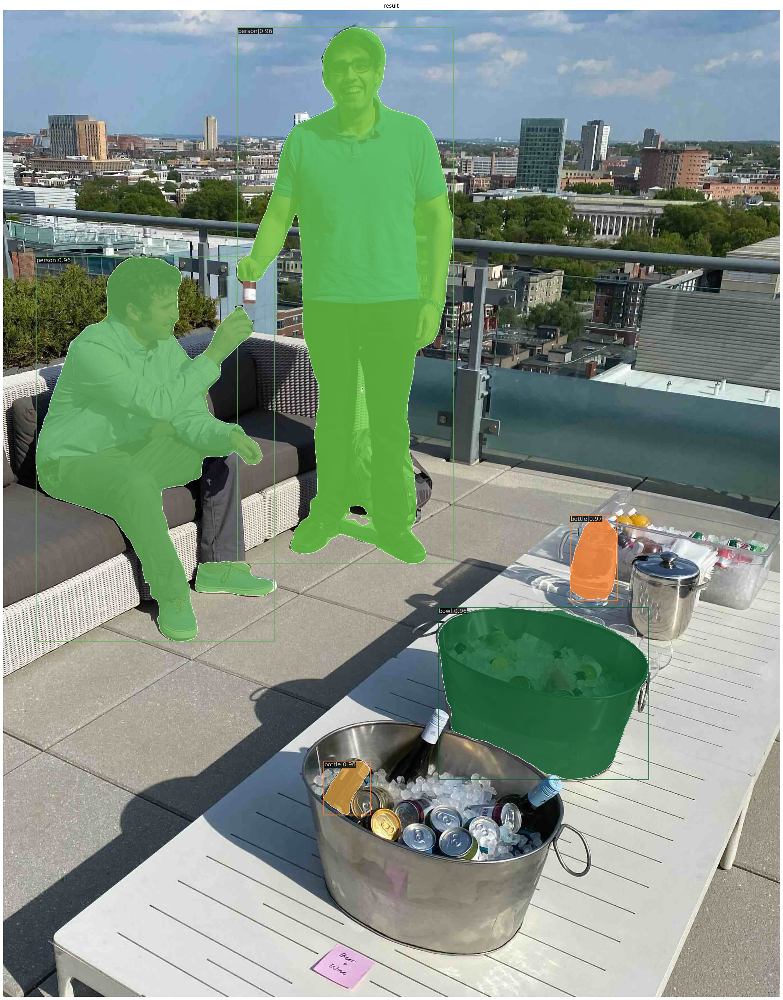

In [21]:
# show the results
show_result_pyplot(model, img, result, score_thr=0.95)

In [22]:
# OSPS model
config_file = '../configs/demo/coco_panoptic_p20.py'
checkpoint_file = '../checkpoints/coco_panoptic_p20.pth'

In [23]:
# build the model from a config file and a checkpoint file
model = init_detector(config_file, checkpoint_file)

load checkpoint from local path: ../checkpoints/coco_panoptic_p20.pth


In [24]:
classes = model.CLASSES
unknown_cat_names = model.panoptic_head.unknown_cat_names
CLASSES = []
for name in classes:
    if name in unknown_cat_names:
        name = '*' + name
    CLASSES.append(name)
model.CLASSES = CLASSES
print(model.CLASSES)
print(len(model.CLASSES))

['person', '*bicycle', '*car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', '*boat', 'traffic light', 'fire hydrant', '*stop sign', 'parking meter', 'bench', 'bird', '*cat', 'dog', 'horse', 'sheep', '*cow', 'elephant', '*bear', '*zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', '*tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', '*banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', '*pizza', 'donut', '*cake', 'chair', 'couch', 'potted plant', 'bed', '*dining table', '*toilet', 'tv', 'laptop', 'mouse', 'remote', '*keyboard', 'cell phone', 'microwave', 'oven', 'toaster', '*sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush', 'banner', 'blanket', 'bridge', 'cardboard', 'counter', 'curtain', 'door-stuff', 'floor-wood', 'flower', 'fruit', 'gravel',

(3074, 2421, 3)

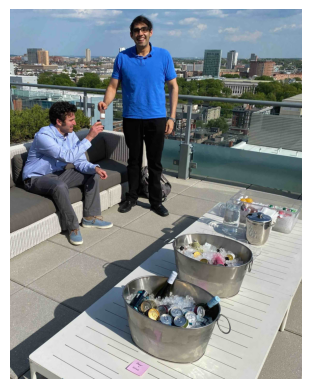

In [25]:
#img = mmcv.imread('../examples/toilet.png').astype(np.uint8)
img = mmcv.imread('../examples/andy.jpeg').astype(np.uint8)
img = mmcv.bgr2rgb(img)
plt.axis('off')
plt.imshow(img)
img.shape

In [26]:
# Predict segmentation results, as well as image captions
result = inference_detector(model, img, with_caption=True, logging=True)[0]

[CLS] there is a man standing next to a woman [SEP] tensor(-3.5737)
[CLS] there is a man and woman standing next to a table [SEP] tensor(-3.6245)
[CLS] there is a man and woman standing in front of a tv [SEP] tensor(-3.5545)
[CLS] there is a man and woman standing in front of a mirror [SEP] tensor(-3.5571)
[CLS] there is a man and woman standing in front of a table [SEP] tensor(-3.6160)
[CLS] there is a man and woman standing in front of a cake [SEP] tensor(-3.6542)
[CLS] there is a man and woman standing in front of a cake. [SEP] tensor(-3.4784)


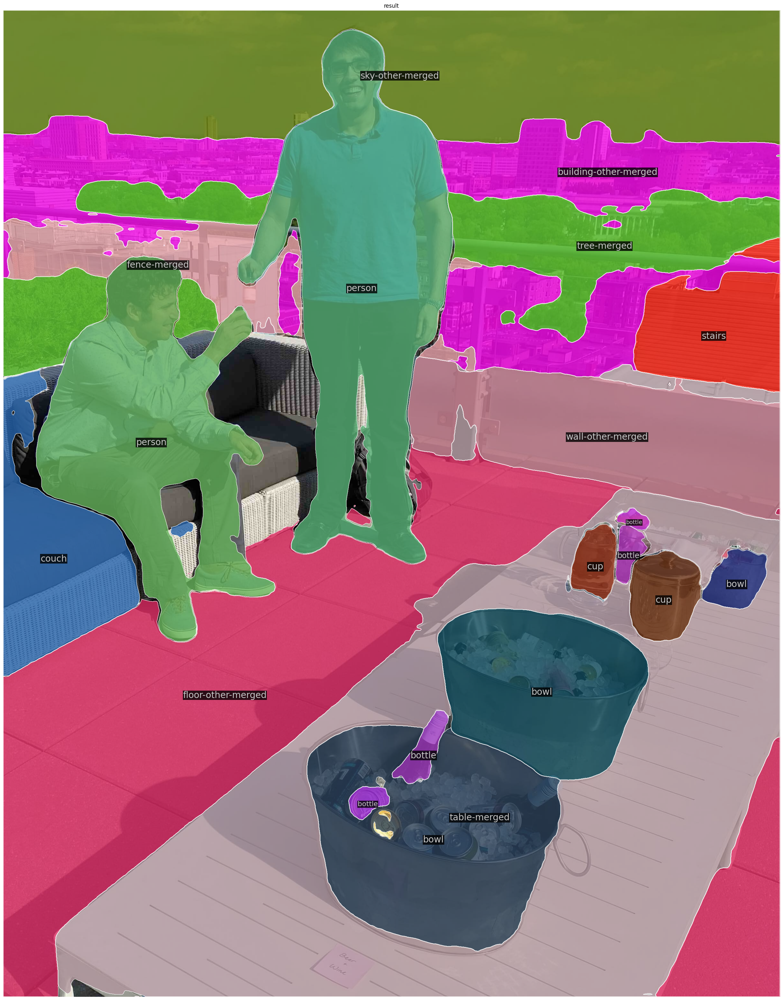

In [27]:
# show the results
show_result_pyplot(model, img, result)